In [82]:
import pandas as pd
import numpy as np
from pprint import pprint
import codecs
import json
import glob
pd.set_option('display.max_columns', None)
from pandas import json_normalize

# 1.1Парсинг и предобработка данных

In [85]:
#Путь к файлам .json
path = 'Desktop/Арбеков_15/Data'
file = glob.glob(path + "/*.json")
df_full=pd.DataFrame()

#df_full=pd.DataFrame(columns=['Пост', 'день публикации', 'месяц публикации', 'время публикации'])
#Цикл для получения файла и его загрузки, используя json.load 
for filename in file:
    name = filename.split("\\")[-1][:-5]
    with codecs.open(filename, 'r', 'utf-8-sig') as json_file:  
        data = json.load(json_file)
    
    if 'refs' in data:
        for article in data['refs']:  
            if article != None:
                df=pd.concat(
                    [
                        pd.DataFrame([article[0]],columns=['Post']),
                        json_normalize(article[1]),
                        pd.DataFrame([name],columns=['Company'])
                    ],
                    axis=1
                )
                df_full=pd.concat([df_full,df],axis=0,ignore_index=True)

In [84]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 427 entries, 0 to 426
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Post     427 non-null    object
 1   day      427 non-null    object
 2   month    427 non-null    object
 3   time     427 non-null    object
 4   Company  427 non-null    object
dtypes: object(5)
memory usage: 16.8+ KB


In [5]:
df_full.head()

,Post,day,month,time,Company
0,7 декабря состоялась церемония награждения лау...,8,декабря,09:30,Cybersport.Metaratings
1,7 декабря состоялась церемония награждения лау...,8,декабря,09:30,ESforce Holding
2,Из совместного исследования издателя компьютер...,29,июля,13:50,ESforce Holding
3,По статистике The Esports Observer за I полови...,9,июля,09:33,ESforce Holding
4,Компании SuperData Research и PayPal провели с...,11,апреля,12:43,ESforce Holding


# Формирование датфрейма с информацией о компании и 1.2 Формирование структуры набора данных

In [6]:
#Путь к файлам .json
path = 'Desktop/Арбеков_15/Data'
file = glob.glob(path + "/*.json")


df = pd.DataFrame(columns=['rate','subs','industries','about','Company']) 

#Цикл для получения файла и его загрузки, используя json.load 
for filename in file:
    with codecs.open(filename, 'r', 'utf-8-sig') as json_file:  
        data = json.load(json_file)
        name = filename.split("\\")[-1][:-5]   
        try:
            company_info=pd.concat([json_normalize(data['info']),pd.DataFrame([name],columns=['Company'])],axis=1)
        except:
            d={'rate':['Не указано'],'subs':['Не указано'],'industries':['Не указано'],'about':['Не указано']}
            company_info=pd.concat([pd.DataFrame(d),pd.DataFrame([name],columns=['Company'])],axis=1)
    df = pd.concat([df,company_info], axis=0, ignore_index=True)
df.head()    
   

,rate,subs,industries,about,Company
0,Не указано,Не указано,Не указано,Не указано,Cybersport.Metaratings
1,Не указано,Не указано,Не указано,Не указано,ESforce Holding
2,Не указано,Не указано,Не указано,Не указано,Gett
3,Не указано,Не указано,Не указано,Не указано,Goose Gaming
4,Не указано,Не указано,Не указано,Не указано,MMA.Metaratings


# <font size="4"> Атрибуты для определения: Post - Этот атрибут содержит текст поста, который может содержать информацию о тематике и содержании контента, связанного с премией Рунета. Анализ текста может помочь определить связь между содержимым поста и номинацией премии. День публикации, месяц публикации, время публикации: эти атрибуты отражают время публикации поста, которое может быть связано с активностью и популярностью контента. Определение временных паттернов может помочь выявить зависимости между публикацией и премией. Исключаем: Rate, subs, industries, about: Эти атрибуты содержат информацию о рейтинге, подписчиках, отраслях и описании компании. В данной задаче они могут не иметь непосредственной связи с номинацией премии Рунета, поэтому их можно исключить из анализа для определения классов.

In [7]:
tk = df_full.merge(df, on='Company',how='left')

In [8]:
tk.shape

(1112, 9)

In [9]:
tk.head()

,Post,day,month,time,Company,rate,subs,industries,about
0,7 декабря состоялась церемония награждения лау...,8,декабря,09:30,Cybersport.Metaratings,Не указано,Не указано,Не указано,Не указано
1,7 декабря состоялась церемония награждения лау...,8,декабря,09:30,ESforce Holding,Не указано,Не указано,Не указано,Не указано
2,Из совместного исследования издателя компьютер...,29,июля,13:50,ESforce Holding,Не указано,Не указано,Не указано,Не указано
3,По статистике The Esports Observer за I полови...,9,июля,09:33,ESforce Holding,Не указано,Не указано,Не указано,Не указано
4,Компании SuperData Research и PayPal провели с...,11,апреля,12:43,ESforce Holding,Не указано,Не указано,Не указано,Не указано


# <font size="4"> Объединение датафреймов с использованием метода merge и последующий вызов методов shape и head() полезны для проверки корректности объединения данных, анализа размерности и просмотра первых строк объединенного датафрейма. Также здесь мы задействовали атрибут Company для объединения датафреймов, что и является обоснованием его использования

# 1.3Предварительная обработка текстовых данных

In [10]:
import pymorphy2
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [11]:
sw = stopwords.words('russian')
morph = pymorphy2.MorphAnalyzer()

def clear_text(text):
    text=text.lower()
    text = re.sub(r'[^а-яё ]','', str(text))
    tokens=word_tokenize(text, language="russian")
    tokens = [morph.parse(i)[0].normal_form for i in tokens]
    tokens = [ i for i in tokens if i not in sw and len(i) > 3]
    return tokens

In [12]:
tk['lemmatize_tokens'] = tk['Post'].apply(clear_text)

In [13]:
tk.head()

,Post,day,month,time,Company,rate,subs,industries,about,lemmatize_tokens
0,7 декабря состоялась церемония награждения лау...,8,декабря,09:30,Cybersport.Metaratings,Не указано,Не указано,Не указано,Не указано,"[декабрь, состояться, церемония, награждение, ..."
1,7 декабря состоялась церемония награждения лау...,8,декабря,09:30,ESforce Holding,Не указано,Не указано,Не указано,Не указано,"[декабрь, состояться, церемония, награждение, ..."
2,Из совместного исследования издателя компьютер...,29,июля,13:50,ESforce Holding,Не указано,Не указано,Не указано,Не указано,"[совместный, исследование, издатель, компьютер..."
3,По статистике The Esports Observer за I полови...,9,июля,09:33,ESforce Holding,Не указано,Не указано,Не указано,Не указано,"[статистика, половина, впервые, самый, просмат..."
4,Компании SuperData Research и PayPal провели с...,11,апреля,12:43,ESforce Holding,Не указано,Не указано,Не указано,Не указано,"[компания, провести, совместный, исследование,..."


In [15]:
tk['clear_text'] = tk['lemmatize_tokens'].apply(lambda x: " ".join(x))

In [16]:
tk.head()

,Post,day,month,time,Company,rate,subs,industries,about,lemmatize_tokens,clear_text
0,7 декабря состоялась церемония награждения лау...,8,декабря,09:30,Cybersport.Metaratings,Не указано,Не указано,Не указано,Не указано,"[декабрь, состояться, церемония, награждение, ...",декабрь состояться церемония награждение лауре...
1,7 декабря состоялась церемония награждения лау...,8,декабря,09:30,ESforce Holding,Не указано,Не указано,Не указано,Не указано,"[декабрь, состояться, церемония, награждение, ...",декабрь состояться церемония награждение лауре...
2,Из совместного исследования издателя компьютер...,29,июля,13:50,ESforce Holding,Не указано,Не указано,Не указано,Не указано,"[совместный, исследование, издатель, компьютер...",совместный исследование издатель компьютерный ...
3,По статистике The Esports Observer за I полови...,9,июля,09:33,ESforce Holding,Не указано,Не указано,Не указано,Не указано,"[статистика, половина, впервые, самый, просмат...",статистика половина впервые самый просматриват...
4,Компании SuperData Research и PayPal провели с...,11,апреля,12:43,ESforce Holding,Не указано,Не указано,Не указано,Не указано,"[компания, провести, совместный, исследование,...",компания провести совместный исследование евро...


In [17]:
tk.to_csv('data.csv', index=False)

# <font size = "4"> Приведение текста к нижнему регистру(lower()) помогает унифицировать данные и избежать проблем с различными вариантами написания слов. Удаление символов и знаков препинания( re.sub(r'[^а-яё ]','', str(text)) ) позволяет удалить ненужные символы, сосредоточившись только на текстовых данных. Токенизация (word_tokenize) помогает разделить текст на отдельные слова или токены, что упрощает последующий анализ и обработку. Лемматизация слов ( позволяет привести слова к их базовой форме, унифицируя данные и учитывая различные формы слова. Удаление стоп-слов (nltk.corpus.stopwords) помогает избавиться от часто встречающихся слов, которые не несут смысловой нагрузки и могут вносить шум в данные.

# 1.4Векторизация и поиск ngram

In [18]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, HashingVectorizer

In [19]:
tfidf = TfidfVectorizer(min_df=5,max_df=0.8, ngram_range=(1, 2))
X_tfidf = tfidf.fit_transform(tk['clear_text'])
df_tfidf = pd.DataFrame(X_tfidf.toarray(), columns = tfidf.get_feature_names())
df_tfidf.head()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,аббревиатура,абзац,абитуриент,абонент,абсолютно,абсолютно весь,абсолютно любой,абсолютно новый,абсолютно нормально,абсолютно разный,абсолютно уверенный,абсолютный,абсолютный большинство,абстрагирование,абстрагироваться,абстрактный,абстракция,абсурдный,аванс,авантюра,аварийный,авария,аватар,август,авиабилет,авиакомпания,авиационный,авиация,авить,авот,австралийский,австралия,австрия,авто,автобус,автобусный,автограф,автодополнение,автомат,автоматизатор,автоматизация,автоматизация бизнес,автоматизация процесс,автоматизация работа,автоматизация тестирование,автоматизированный,автоматизированный система,автоматизированный тестирование,автоматизировать,автоматизировать процесс,автоматизировать рутинный,автоматика,автоматически,автоматический,автоматический режим,автоматический система,автоматический тестирование,автомобилист,автомобиль,автомобильный,автономно,автономность,автономный,автономный некоммерческий,автономный работа,автопарк,автопилот,автор,автор давать,автор идея,автор книга,автор который,автор курс,автор мочь,автор получить,автор помочь,автор предоставить,автор проект,автор рассказывать,автор свой,автор статья,автор телеграмканал,автор хороший,автор чтоть,авторизация,авторизовать,авторитет,авторитетный,авторский,авторский канал,авторский право,авторство,автотест,агенство,агент,агентский,агентство,агентство который,агентство специализироваться,агентство студия,агентство тасс,агентство туризм,агрегат,агрегатор,агрегатор такси,агрегация,агрегировать,агрессивно,агрессивный,агрессия,адам,адаптация,адаптер,адаптивность,адаптивный,адаптивный вёрстка,адаптивный дизайн,адаптировать,адаптировать свой,адаптироваться,адвокат,адекватно,адекватность,адекватный,адекватный цена,адекватный человек,адепт,админ,административный,администратор,администратор который,администрация,администрация президент,администрирование,админк,админовый,адольф,адреналин,адрес,адрес который,адрес электронный,адресат,адресный,адресовать,адский,аести,аещё,ажиотаж,азарт,азартный,азартный игра,азбука,азиатский,азия,азов,азотный,айдентик,айсберг,айти,айти курс,айтишник,айтишный,айфон,академик,академический,академия,академия наука,аквариум,аккаунт,аккорд,аккредитация,аккумулятор,аккумуляторный,аккуратно,аккуратность,аккуратный,акселератор,аксессуар,актив,активация,активизировать,активизироваться,активировать,активироваться,активист,активно,активно заниматься,активно искать,активно использовать,активно использоваться,активно общаться,активно пользоваться,активно продвигать,активно работать,активно развиваться,активно расти,активно участвовать,активность,активность который,активность мозг,активный,активный использование,активный пользователь,активный работа,активный сообщество,активный участие,активный участник,актриса,актуализация,актуализировать,актуально,актуальность,актуальный,актуальный версия,актуальный вопрос,актуальный информация,актуальный проблема,актуальный состояние,актуальный тема,актёр,акустический,акцент,акцентировать,акцентировать внимание,акционер,акция,акция компания,алан,алгоритм,алгоритм который,алгоритм машинный,алгоритм мочь,алгоритм обработка,алгоритм очень,алгоритм поиск,алгоритм работа,алгоритм распознавание,алгоритм структура,алгоритмика,алгоритмический,алекс,александр,александр рассказать,александрович,алексей,алексей копылов,алексей некрасов,алерот,алиас,алина,алиса,алиэкспресс,алкоголизм,алкоголь,алкогольный,аллергия,алло,алфавит,алфавитный,алфавитный порядок,альберт,альбом,альтернатива,альтернативный,альтернативный вариант,альтернативный метод,альф,альфа,альфабанк,альфабанка,альцгеймер,алюминиевый,алюминий,алёна,амазона,амбициозный,амбициозный цель,амбиция,америка,американец,американский,американский компания,амортизатор,амочь,ампер,амплитуда,амстердам,амстердам нидерланды,анализ,анализ данные,анализ который,анализ кровь,анализ медицинский,анализ работа,анализ рынок,анализатор,анализировать,анализировать дать,анализироваться,аналитик,аналитик бывать,аналитик данные,аналитик который,аналитик тестировщик,аналитика,аналитика данные,аналитич

In [20]:
X_tfidf

<1112x31220 sparse matrix of type '<class 'numpy.float64'>'
	with 714739 stored elements in Compressed Sparse Row format>

In [21]:
df_tfidf["Company"]=tk["Company"]

# <font size = "4"> Метод TfidfVectorizer был выбран для преобразования текстовых данных в числовое представление с учетом важности слов в документе. Обоснование: его способность учесть важность и распределение терминов в текстовых данных, а также возможность контроля над минимальной и максимальной частотой терминов. Это позволяет получить числовое представление текста, которое учитывает особенности каждого документа и может быть использовано для дальнейшего анализа и классификации.

In [22]:
count = CountVectorizer(min_df=5,max_df=0.8, ngram_range=(1, 2))
X_count = count.fit_transform(tk['clear_text'])
df_count = pd.DataFrame(X_count.toarray(),columns = count.get_feature_names())
df_count.head()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,аббревиатура,абзац,абитуриент,абонент,абсолютно,абсолютно весь,абсолютно любой,абсолютно новый,абсолютно нормально,абсолютно разный,абсолютно уверенный,абсолютный,абсолютный большинство,абстрагирование,абстрагироваться,абстрактный,абстракция,абсурдный,аванс,авантюра,аварийный,авария,аватар,август,авиабилет,авиакомпания,авиационный,авиация,авить,авот,австралийский,австралия,австрия,авто,автобус,автобусный,автограф,автодополнение,автомат,автоматизатор,автоматизация,автоматизация бизнес,автоматизация процесс,автоматизация работа,автоматизация тестирование,автоматизированный,автоматизированный система,автоматизированный тестирование,автоматизировать,автоматизировать процесс,автоматизировать рутинный,автоматика,автоматически,автоматический,автоматический режим,автоматический система,автоматический тестирование,автомобилист,автомобиль,автомобильный,автономно,автономность,автономный,автономный некоммерческий,автономный работа,автопарк,автопилот,автор,автор давать,автор идея,автор книга,автор который,автор курс,автор мочь,автор получить,автор помочь,автор предоставить,автор проект,автор рассказывать,автор свой,автор статья,автор телеграмканал,автор хороший,автор чтоть,авторизация,авторизовать,авторитет,авторитетный,авторский,авторский канал,авторский право,авторство,автотест,агенство,агент,агентский,агентство,агентство который,агентство специализироваться,агентство студия,агентство тасс,агентство туризм,агрегат,агрегатор,агрегатор такси,агрегация,агрегировать,агрессивно,агрессивный,агрессия,адам,адаптация,адаптер,адаптивность,адаптивный,адаптивный вёрстка,адаптивный дизайн,адаптировать,адаптировать свой,адаптироваться,адвокат,адекватно,адекватность,адекватный,адекватный цена,адекватный человек,адепт,админ,административный,администратор,администратор который,администрация,администрация президент,администрирование,админк,админовый,адольф,адреналин,адрес,адрес который,адрес электронный,адресат,адресный,адресовать,адский,аести,аещё,ажиотаж,азарт,азартный,азартный игра,азбука,азиатский,азия,азов,азотный,айдентик,айсберг,айти,айти курс,айтишник,айтишный,айфон,академик,академический,академия,академия наука,аквариум,аккаунт,аккорд,аккредитация,аккумулятор,аккумуляторный,аккуратно,аккуратность,аккуратный,акселератор,аксессуар,актив,активация,активизировать,активизироваться,активировать,активироваться,активист,активно,активно заниматься,активно искать,активно использовать,активно использоваться,активно общаться,активно пользоваться,активно продвигать,активно работать,активно развиваться,активно расти,активно участвовать,активность,активность который,активность мозг,активный,активный использование,активный пользователь,активный работа,активный сообщество,активный участие,активный участник,актриса,актуализация,актуализировать,актуально,актуальность,актуальный,актуальный версия,актуальный вопрос,актуальный информация,актуальный проблема,актуальный состояние,актуальный тема,актёр,акустический,акцент,акцентировать,акцентировать внимание,акционер,акция,акция компания,алан,алгоритм,алгоритм который,алгоритм машинный,алгоритм мочь,алгоритм обработка,алгоритм очень,алгоритм поиск,алгоритм работа,алгоритм распознавание,алгоритм структура,алгоритмика,алгоритмический,алекс,александр,александр рассказать,александрович,алексей,алексей копылов,алексей некрасов,алерот,алиас,алина,алиса,алиэкспресс,алкоголизм,алкоголь,алкогольный,аллергия,алло,алфавит,алфавитный,алфавитный порядок,альберт,альбом,альтернатива,альтернативный,альтернативный вариант,альтернативный метод,альф,альфа,альфабанк,альфабанка,альцгеймер,алюминиевый,алюминий,алёна,амазона,амбициозный,амбициозный цель,амбиция,америка,американец,американский,американский компания,амортизатор,амочь,ампер,амплитуда,амстердам,амстердам нидерланды,анализ,анализ данные,анализ который,анализ кровь,анализ медицинский,анализ работа,анализ рынок,анализатор,анализировать,анализировать дать,анализироваться,аналитик,аналитик бывать,аналитик данные,аналитик который,аналитик тестировщик,аналитика,аналитика данные,аналитич

In [23]:
X_count

<1112x31220 sparse matrix of type '<class 'numpy.int64'>'
	with 714739 stored elements in Compressed Sparse Row format>

In [24]:
df_count["Company"]=tk["Company"]

# <font size = "4"> Метод векторизации CountVectorizer выбран для преобразования текстовых данных в числовые признаки на основе подсчета частоты встречаемости слов. Он подсчитывает количество вхождений каждого слова в тексте. Это позволяет учесть, насколько часто определенное слово появляется в тексте, что может быть полезной информацией при анализе текстовых данных. Также есть униграммы, которые представляют отдельные слова и биграммы представляют пары последовательных слов. Это позволяет учесть не только отдельные слова, но и их комбинации, что может быть полезным при анализе контекста и связей между словами. Параметры min_df и max_df позволяют фильтровать слова по их частоте в тексте. И, конечно, данный метод преобразует тексты в матрицу признаков.

# 1.5Тематическое моделирование

# 1.6Кластеризация

In [46]:
from sklearn.cluster import KMeans, Birch, MiniBatchKMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

In [27]:
scaler = MinMaxScaler()
X = scaler.fit_transform(X)

In [28]:
pca = PCA(n_components=2)
X = pca.fit_transform(X)

In [29]:
def viz(prediction):
    plt.figure(figsize=(12, 12))
    plt.subplot(224)
    plt.scatter(X[:, 0], X[:, 1], c=prediction)
    plt.title("Unevenly Sized Blobs")
    plt.show()

In [33]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(X)
kmpreds = kmeans.predict(X)
df_tfidf["KMCLUSTS"] = kmpreds

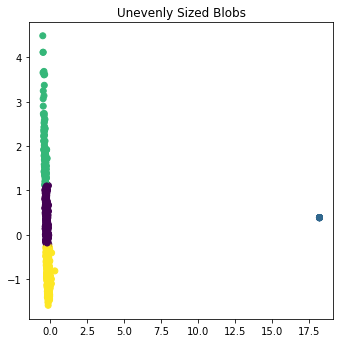

In [38]:
viz(df_tfidf["KMCLUSTS"])

# <font size = "4"> Метод кластеризации KMeans выбран для разделения данных на кластеры на основе сходства между ними. Это позволяет интерпретировать и анализировать полученные кластеры, искать закономерности и сделать выводы о сходстве или различии между кластерами. Также принимает на вход числовые признаки, что соответствует векторизованным данным, полученным с помощью TfidfVectorizer и CountVectorizer.

In [39]:
kbmeans = MiniBatchKMeans(n_clusters=4, random_state=0, batch_size=4096)
df_tfidf["KBCLUSTS"] = kbmeans.fit_predict(X)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=5
  warnings.warn(


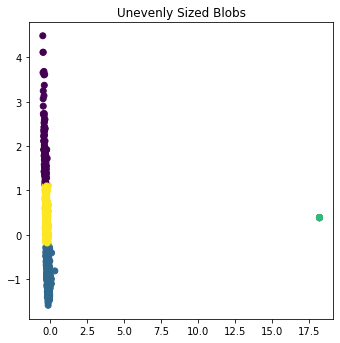

In [42]:
viz(df_tfidf["KBCLUSTS"])

# <font size = "4"> MiniBatchKMeans является вариантом алгоритма KMeans, который работает с небольшими мини-пакетами данных вместо полного набора данных.MiniBatchKMeans позволяет ускорить обучение модели путем обработки небольших пакетов данных одновременно, вместо обработки всего набора данных. Это особенно полезно при работе с большими объемами данных. Также он позволяет обрабатывать данные порциями, что делает его более гибким и масштабируемым для больших проектов. В отличие от KMeans, MiniBatchKMeans может давать немного отличающиеся результаты при каждом запуске, но при этом сохраняет общую структуру кластеров - аппроксимация результатов.

In [44]:
gm = GaussianMixture(n_components=2, random_state=0).fit_predict(X)
df_tfidf["GMCLUSTS"] = gm

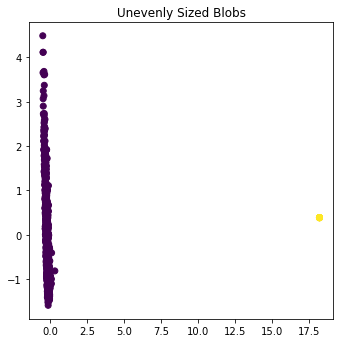

In [45]:
viz(df_tfidf["GMCLUSTS"])

# <font size = "4"> Метод кластеризации GaussianMixture основан на гауссовых смесях (Gaussian Mixtures). GaussianMixture позволяет моделировать данные с помощью комбинации нескольких гауссовых распределений. Это позволяет обнаруживать более сложные структуры и формы кластеров, чем простой алгоритм KMeans. Способен обрабатывать данные с разными формами кластеров. Также GaussianMixture предоставляет вероятностную интерпретацию принадлежности объектов к каждому кластеру. Еще метод может использоваться для оценки скрытых переменных, таких как метки классов, что делает его полезным инструментом в задачах разведочного анализа данных.

In [58]:
from sklearn.metrics import calinski_harabasz_score 
from sklearn.metrics import davies_bouldin_score
import sklearn.metrics

# Метрики качества

# <font size = "4"> KMeans 

In [59]:
print(sklearn.metrics.calinski_harabasz_score(X, df_tfidf["KMCLUSTS"]))
print(sklearn.metrics.davies_bouldin_score(X, df_tfidf["KMCLUSTS"]))

10594.743373994825
0.4118067707757497


# MiniBatchKMeans

In [60]:
print(sklearn.metrics.calinski_harabasz_score(X, df_tfidf["KBCLUSTS"]))
print(sklearn.metrics.davies_bouldin_score(X, df_tfidf["KBCLUSTS"]))

10594.195427509434
0.4110934414383768


# GaussianMixture

In [61]:
print(sklearn.metrics.calinski_harabasz_score(X, df_tfidf["GMCLUSTS"]))
print(sklearn.metrics.davies_bouldin_score(X, df_tfidf["GMCLUSTS"]))

4339.214013202951
0.04398012277423544


# <font size = "4"> По итогам кластеризации - мы выявили, что метод GaussianMixture - лучший из трех. Он позволяет обнаруживать более сложные структуры и формы кластеров, чем KMeans(и соответственно его вариация MiniBatchKMeans), подробнее об этом написано в обосновании использования метода GaussianMixture. Поэтому, чтобы иметь наиболее точный результат по ходу выполнения работы - мы выбираем метод GaussianMixture, а остальные результаты убираем.

In [62]:
df_tfidf.drop(columns=['KMCLUSTS', 'KBCLUSTS'], axis=1, inplace=True)

# 2.1 и 2.2 Классификация и разбиение выборки

In [172]:
df=pd.read_json("Desktop/Арбеков_15/Data/Target.json") 
df = df.rename(columns = {"Company": "Company"}) 
df

,Company,Nominations
0,Здоровье.ру,Здоровье и медицина
1,Проект по использованию технологий компьютерно...,Здоровье и медицина
2,Skillbox,"Наука, технологии и инновации"
3,Gett,"Наука, технологии и инновации"
4,Промобот,"Наука, технологии и инновации"
5,Иннотех,"Наука, технологии и инновации"
6,Cybersport.Metaratings,Игровая индустрия и киберспорт
7,MMA.Metaratings,Игровая индустрия и киберспорт
8,Goose Gaming,Игровая индустрия и киберспорт
9,ESforce Holding,Игровая индустрия и киберспорт


In [103]:
df_tfidf["Company"]

0               Cybersport.Metaratings
1                      ESforce Holding
2                      ESforce Holding
3                      ESforce Holding
4                      ESforce Holding
                     ...              
1107    Федерация креативных индустрий
1108    Федерация креативных индустрий
1109    Федерация креативных индустрий
1110    Федерация креативных индустрий
1111    Федерация креативных индустрий
Name: Company, Length: 1112, dtype: object

In [104]:
df_tfidf=df_tfidf.merge(df, on='Company')
df_tfidf['Nominations']

0      Игровая индустрия и киберспорт
1      Игровая индустрия и киберспорт
2      Игровая индустрия и киберспорт
3      Игровая индустрия и киберспорт
4      Игровая индустрия и киберспорт
                    ...              
808              Креативные индустрии
809              Креативные индустрии
810              Креативные индустрии
811              Креативные индустрии
812              Креативные индустрии
Name: Nominations, Length: 813, dtype: object

<AxesSubplot:xlabel='Nominations', ylabel='Count'>

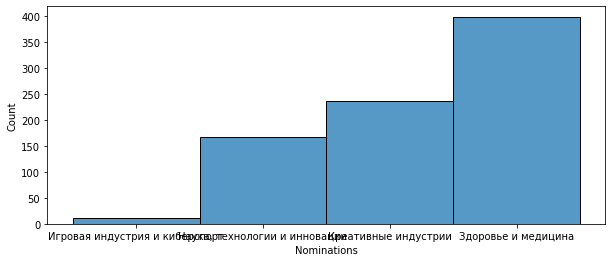

In [105]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10,4))
sns.histplot(data=df_tfidf,x='Nominations')

In [106]:
from sklearn.model_selection import train_test_split

In [107]:
x=df_tfidf.drop(['Nominations', "Company"], axis=1)
y=df_tfidf['Nominations']

In [108]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42, stratify=y)

In [113]:
from sklearn.tree import DecisionTreeClassifier as Tree

In [169]:
tree = Tree(max_depth=20, min_samples_split=9, min_samples_leaf=3)

In [170]:
tree.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=20, min_samples_leaf=3, min_samples_split=9)

In [171]:
print(classification_report(y_test, tree.predict(x_test)))

                                precision    recall  f1-score   support

           Здоровье и медицина       0.90      0.95      0.92       119
Игровая индустрия и киберспорт       1.00      0.50      0.67         4
          Креативные индустрии       0.90      0.87      0.89        71
 Наука, технологии и инновации       0.83      0.78      0.80        50

                      accuracy                           0.89       244
                     macro avg       0.91      0.78      0.82       244
                  weighted avg       0.89      0.89      0.88       244



# <font size = "4"> Использован метод классификации Decision Tree или же Дерево решений. Он имеет простую и понятную модель, которая легко интерпретируется. Работает с различными типами данных: как категориальными, так и числовыми. Также применяется для задач регрессии, что хороший выбор для нашей работы. Учитывает важность признаков, позволяет определить какие признаки имеют наибольшее влияние на предсказание номинаций премии Рунета. И еще можно контролировать глубину дерева, минимальное количество объектов в листе, минимальное кол-во объектов для разделения и тд.

# Оценка модели

In [120]:
predictions = tree.predict(x_test)

In [121]:
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, predictions))

0.860655737704918


In [126]:
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.model_selection import learning_curve 

# 2.3Оптимизация модели

In [175]:
df.head()

,Company,Nominations
0,Здоровье.ру,Здоровье и медицина
1,Проект по использованию технологий компьютерно...,Здоровье и медицина
2,Skillbox,"Наука, технологии и инновации"
3,Gett,"Наука, технологии и инновации"
4,Промобот,"Наука, технологии и инновации"


In [176]:
scaler = MinMaxScaler()
X = scaler.fit_transform(X)